# PCA Assignment

In [9]:
# Maths
import numpy as np
import pandas as pd

# Plotting
import matplotlib.pyplot as plt

# ML
from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

plt.style.use('dark_background')

1. Select 10000 images randomly and work on this sample in the following exercises. To complete this assignment, submit a link to a Jupyter notebook containing your solutions to the following tasks below, and plan on discussing with your mentor. You can also take a look at these example solutions.

2. Load the dataset and make your preprocessing like normalizing the data.
3. Apply PCA to the data and get the first two principal components.
4. Using the first two principal components, draw a graph of the data by coloring and labeling the data points as we did in the checkpoint.
5. Do you think PCA solution is satisfactory? Can you distinguish between different classes easily?

In [13]:
# fetching data
mnist = fetch_openml('Fashion-MNIST', version=1, cache=True)

# pulling random 10k observation
np.random.seed(222)
indices = np.random.choice(70000,10000)
X = mnist.data[indices] / 255.0
Y = mnist.target[indices]

print(X.shape, Y.shape)

(10000, 784) (10000,)


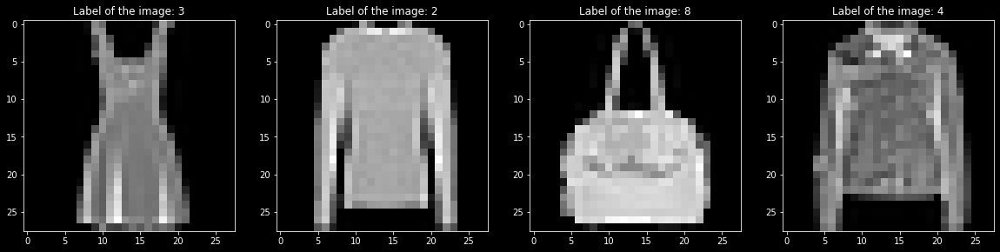

In [14]:
plt.figure(figsize=(20,5))

plt.subplot(141)
plt.imshow(X[123].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(Y[123]))

plt.subplot(142)
plt.imshow(X[124].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(Y[124]))

plt.subplot(143)
plt.imshow(X[125].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(Y[125]))

plt.subplot(144)
plt.imshow(X[126].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(Y[126]))

plt.show()

In [22]:
# Standardizing
#scaler = StandardScaler()
#X_std = scaler.fit_transform(X)

#PCA
pca = PCA(n_components=2)
pca_components = pca.fit_transform(X)

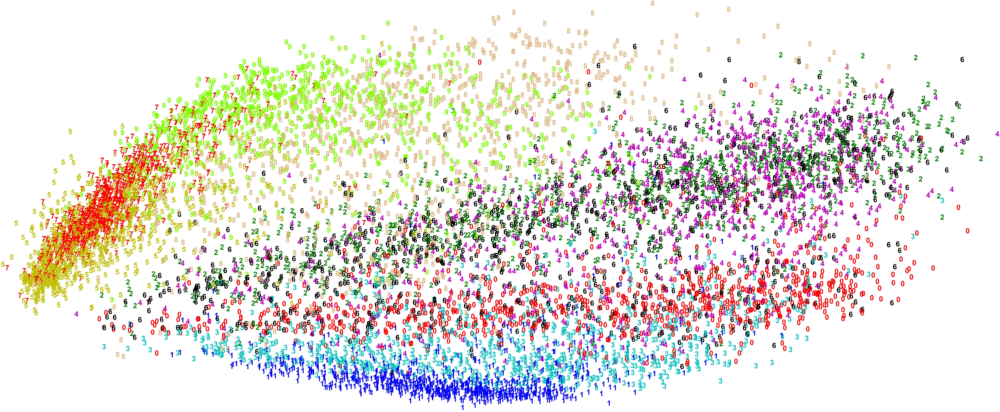

In [26]:
fig = plt.figure(figsize=(10,5))


#plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(Y[i]),
             color=colours[int(Y[i])],
             fontdict={'weight': 'bold', 'size': 75}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

PCA does seem to do interesting work here. I think I can distinguish about 6-7 different groups, but upon zooming in, you can see there is quite a bit of overlap and intertwined groups that would require coloring and labeling to distinguish them. PCA by itself is not satisfactory for clustering.